# 2. Face, age, and gender detection

### یاسمین اخوین        شماره دانشجویی: 810100079
### سروناز صالحی        شماره دانشجویی: 810101462




### 2.1 Load Models

there are two types of files to build a usable neural network:
1. Architecture files ->
describes the structure of the neural network
opencv_face_detector.pbtxt
age_deploy.prototxt
gender_deploy.prototxt

  ```
  opencv_face_detector.pbtxt
  age_deploy.prototxt
  gender_deploy.prototxt
  ```


2. Weight file -> contains the values the model learned during training


```
opencv_face_detector_uint8.pb
age_net.caffemodel
gender_net.caffemodel
```

we use cv2.dnn to load and run these trained neural networks



In [3]:
import cv2
import numpy as np

In [5]:
face_model_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/opencv_face_detector.pbtxt"
face_weights_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/opencv_face_detector_uint8.pb"
age_model_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/age_deploy.prototxt"
age_weights_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/age_net.caffemodel"
gender_model_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/gender_deploy.prototxt"
gender_weights_file_path = "/content/drive/MyDrive/Age-Gender/Age-Gender/gender_net.caffemodel"
face_net = cv2.dnn.readNet(face_weights_file_path, face_model_file_path, "tf")
age_net = cv2.dnn.readNet(age_weights_file_path, age_model_file_path)
gender_net = cv2.dnn.readNet(gender_weights_file_path, gender_model_file_path)

### 2.2 Define Required Labels

In [4]:
ageList = ["(0-2)", "(4-6)", "(8-12)", "(15-20)", "(25-32)", "(38-43)", "(48-53)", "(60-100)"]

genderList = ["Male", "Female"]

MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)

### 2.3 Face detection

we first create a blob from the image

A **blob** is the image converted into the exact format the neural network model expects.

here:


```
setInput(blob) = give the model an image
forward() = run the image through the network and make detections
```

in the detection output, index position 1 contains the class label, which can be from 1 to 80.
Index position 2 contains the **confidence score**. This is not a probability score but rather the model’s confidence for the object belonging to the class that it has detected.
Of the final four values, the first two are x, y bounding box coordinates, and the last is the bounding box’s width and height.

**Bounding box**: when a model detects a face, it returns a rectangle around it which is called a bounding box.


In [6]:
def highlightface(net, frame, conf_threshold=0.7):
  image_height, image_width, _ = frame.shape
  #create blob from image
  blob = cv2.dnn.blobFromImage(frame, 1.0, (300, 300), [104, 117, 123], swapRB=True)
  #set the blob to the model
  net.setInput(blob)
  #forward pass through the model to carry out the detection
  detections = net.forward()
  faceboxes = []
  for d in detections[0, 0, :, :]:
    confidence = d[2]
    if confidence > conf_threshold:
      # get bounding box  coordinates and draw it
      box_x = d[3] * image_width
      box_y = d[4] * image_height
      box_width = d[5] * image_width
      box_height = d[6] * image_height
      cv2.rectangle(frame, (int(box_x), int(box_y)), (int(box_width), int(box_height)), (0, 255, 0), thickness=2)
      faceboxes.append([
          int(box_x),
          int(box_y),
          int(box_width),
          int(box_height)
      ])
  return frame, faceboxes




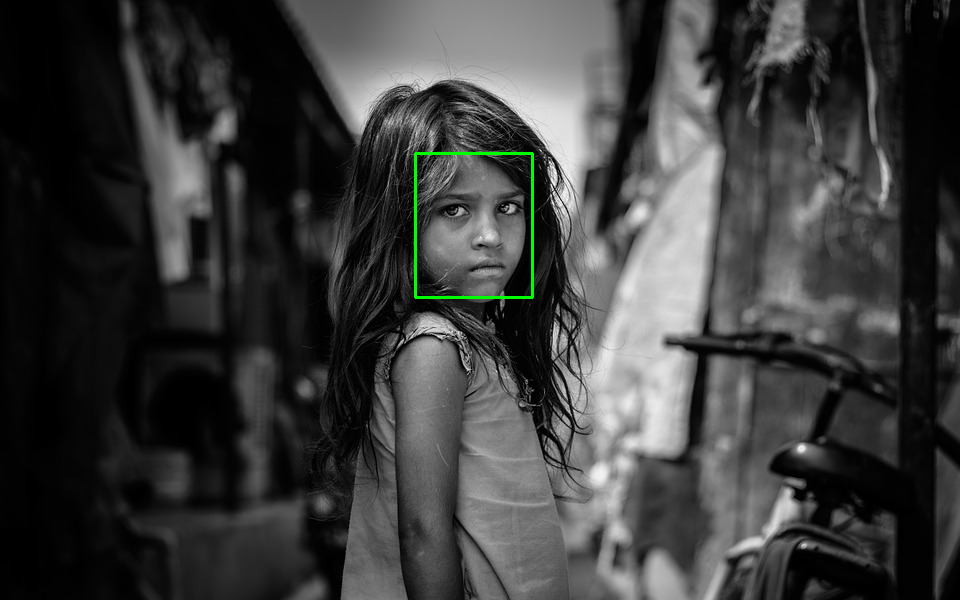

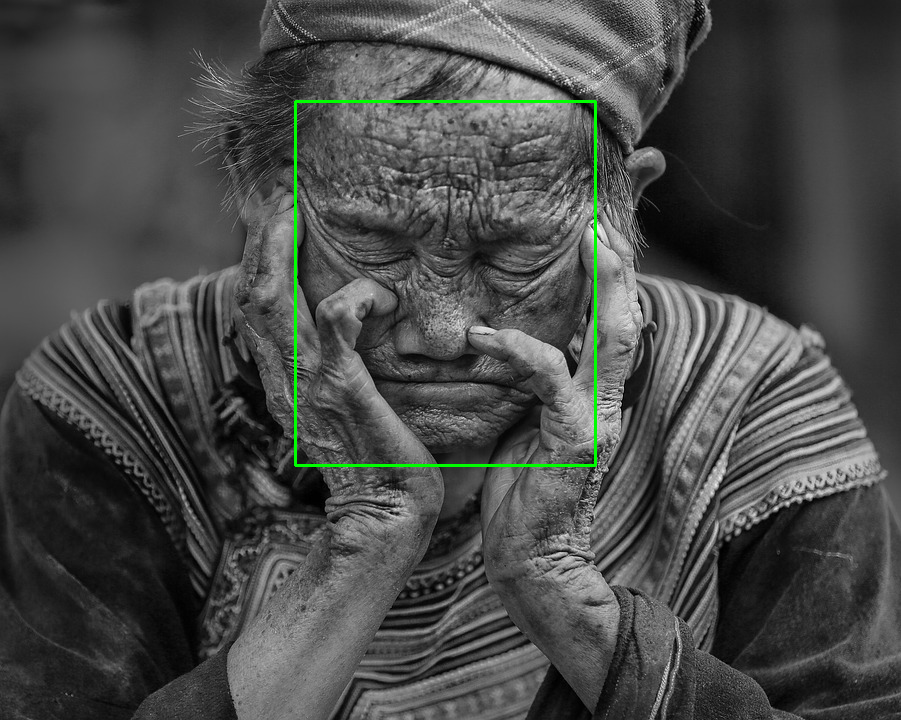

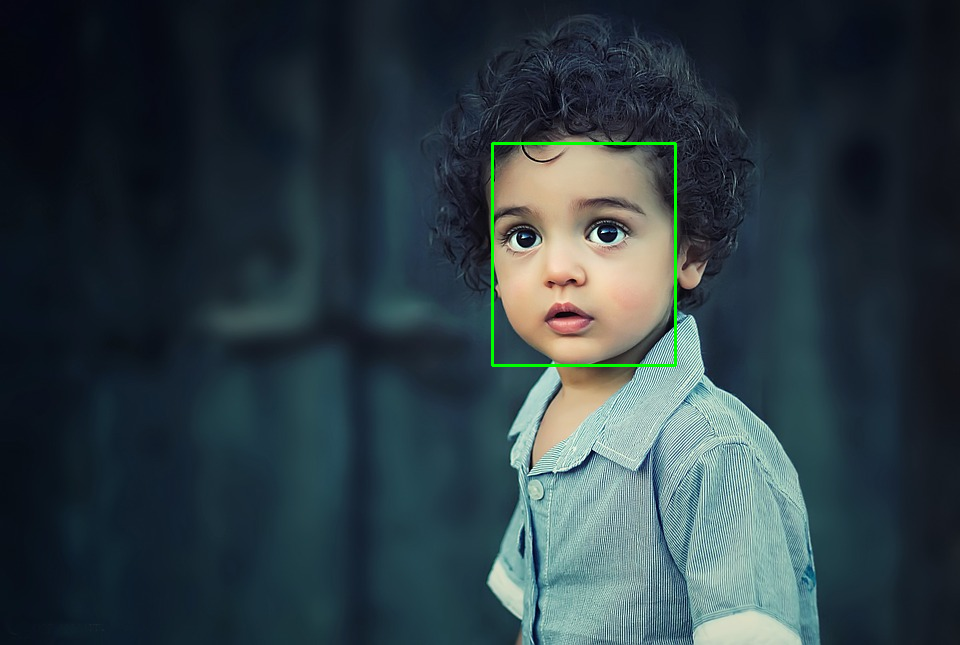

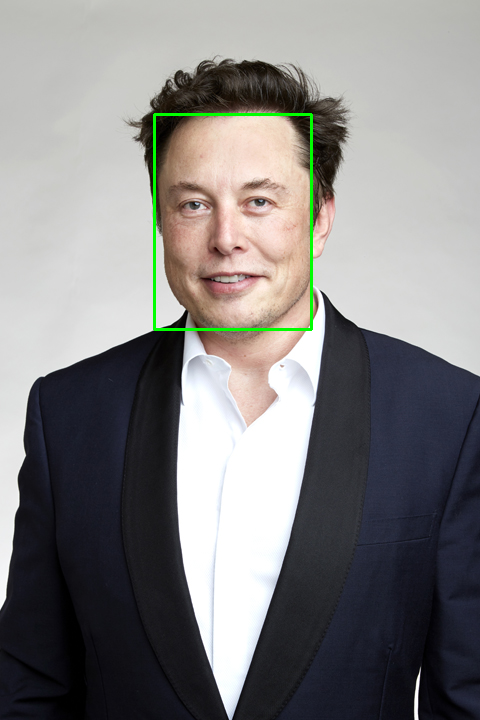

In [7]:
from google.colab.patches import cv2_imshow
import os

all_image_paths = ["/content/drive/MyDrive/Age-Gender/girl.jpg", "/content/drive/MyDrive/Age-Gender/man.jpg", "/content/drive/MyDrive/Age-Gender/kid.jpg", "/content/drive/MyDrive/Age-Gender/musk.jpg"]

for image_path in all_image_paths:

  if not os.path.exists(image_path):
      print(f"Error: Image file not found at '{image_path}'.")
      print("Please ensure Google Drive is mounted and the path is correct. You might need to run `from google.colab import drive; drive.mount('/content/drive')` in a separate cell first.")
  elif cv2.imread(image_path) is None:
      print(f"Error: Could not load image from '{image_path}'. Check file integrity or permissions.")
  else:
      image1 = cv2.imread(image_path)
      highlightface(face_net, image1, 0.7)
      cv2_imshow(image1)
      cv2.waitKey(0)
      cv2.destroyAllWindows()


### 2.4 Age and gender detection

For each detected face, we crop the face with additional padding, preprocess it into a blob, and send it to the gender and age models for classification. The predicted age and gender labels are then displayed on the image.

In [8]:
def detect_face_age_gender(frame, face_net, age_net, gender_net, blur_face=False):
    padding = 20

    resultImg, faceboxes = highlightface(face_net, frame)

    for facebox in faceboxes:
        face = frame[
            max(0, facebox[1] - padding): min(facebox[3] + padding, frame.shape[0] - 1),
            max(0, facebox[0] - padding): min(facebox[2] + padding, frame.shape[1] - 1)
        ]

        if blur_face:
            face = cv2.GaussianBlur(face, (51, 51), 0)

        blob = cv2.dnn.blobFromImage(
            face,
            1.0,
            (227, 227),
            MODEL_MEAN_VALUES,
            swapRB=False
        )

        gender_net.setInput(blob)
        gender_preds = gender_net.forward()
        gender = genderList[gender_preds[0].argmax()]

        age_net.setInput(blob)
        age_preds = age_net.forward()
        age = ageList[age_preds[0].argmax()]

        label = "{}, {}".format(gender, age)

        cv2.putText(
            resultImg,
            label,
            (facebox[0], facebox[1] - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 255),
            2,
            cv2.LINE_AA
        )

    return resultImg

### 2.5 Testing the Models

The classification results indicate overall good performance, with correct gender prediction in 3 out of 4 test cases. The predicted age ranges were also generally close to the actual ages, except for one image where the model estimated a moderately different age group.

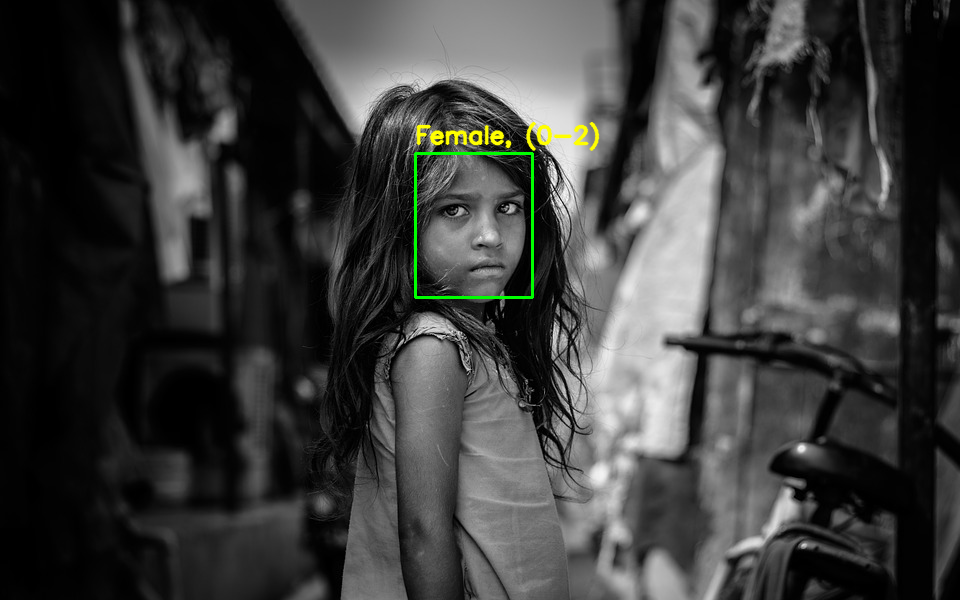

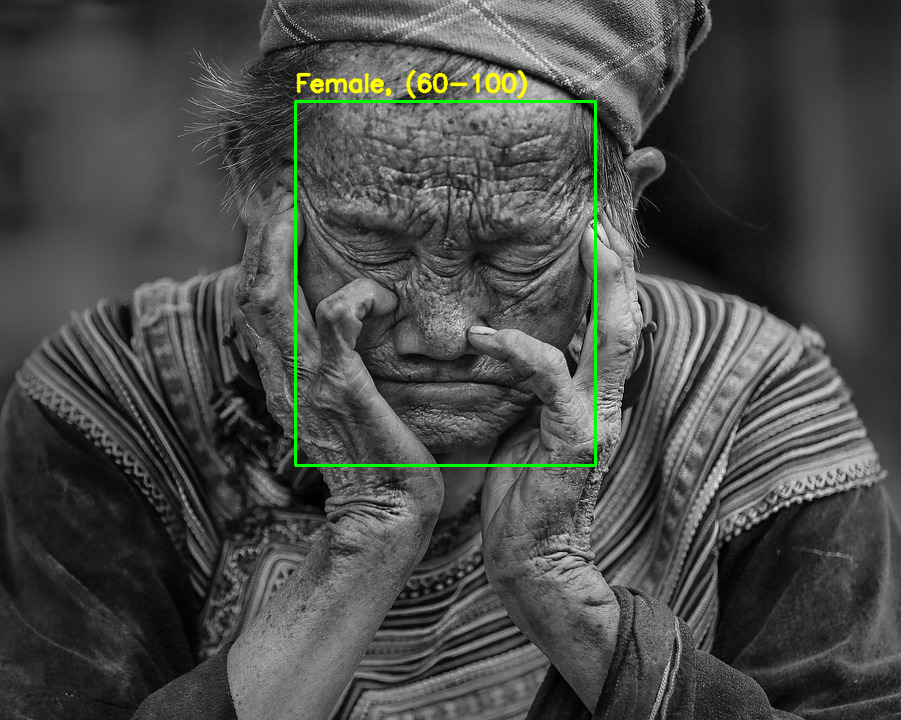

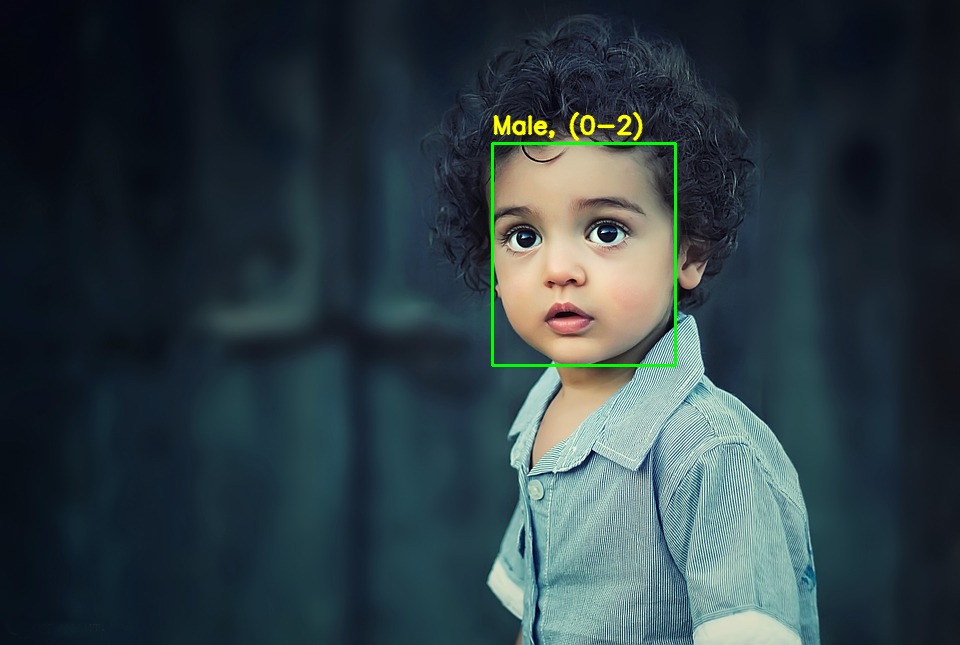

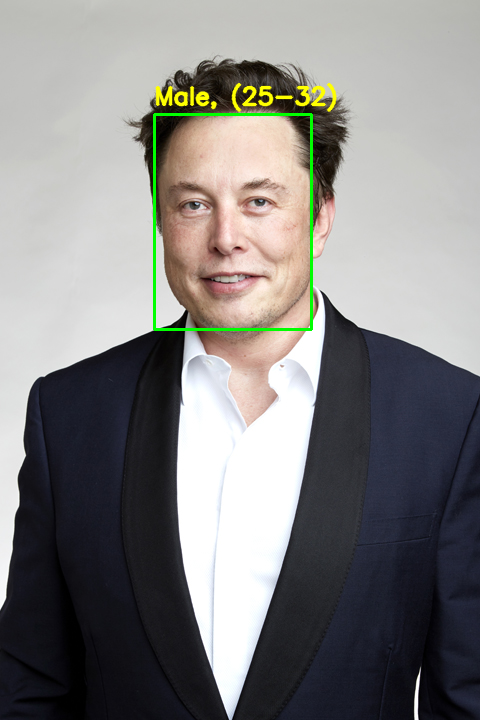

In [9]:
for frame in all_image_paths:
  image1 = cv2.imread(frame)
  detect_face_age_gender(image1, face_net, age_net, gender_net)
  cv2_imshow(image1)

### 2.6 modifying image properties


  2.6.1 Rotating the image and observing the results

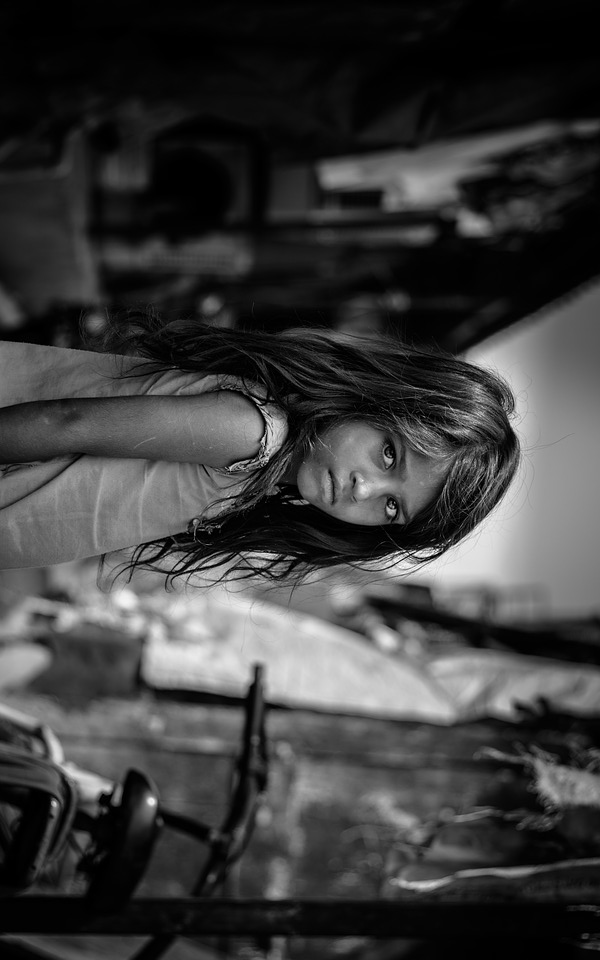

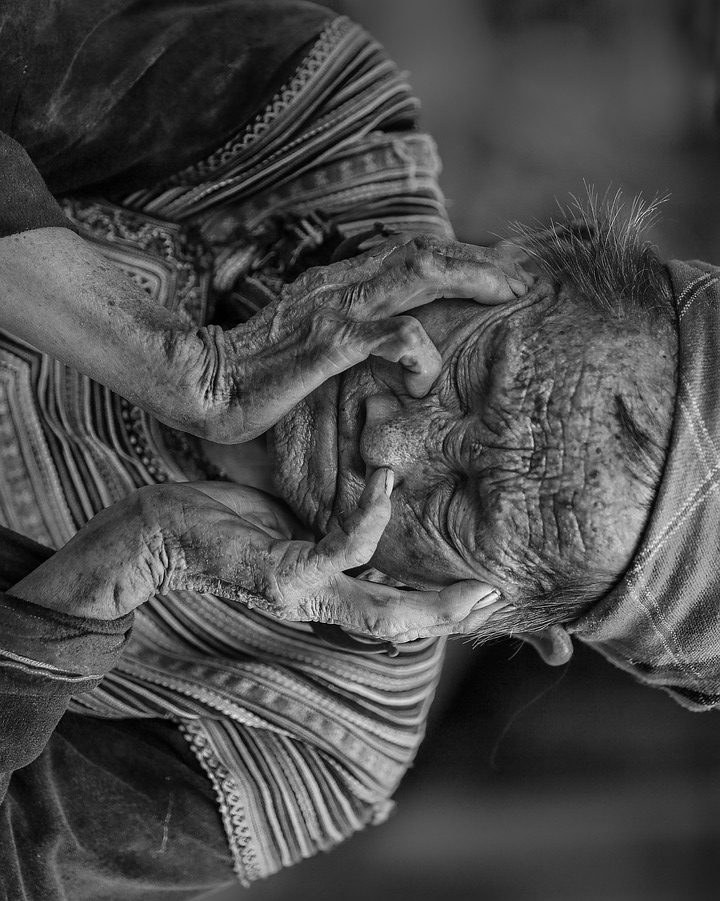

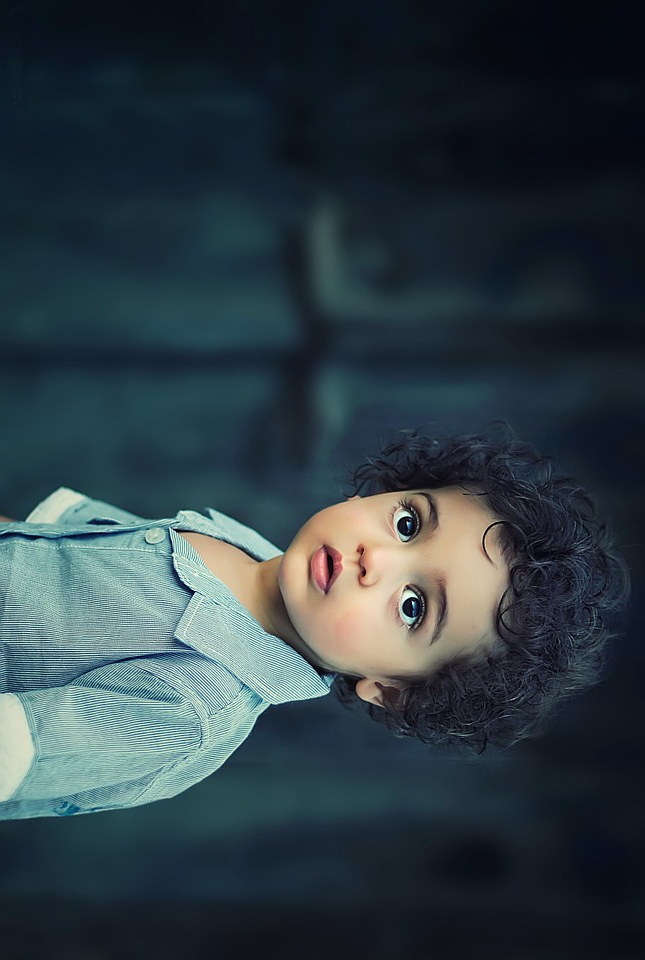

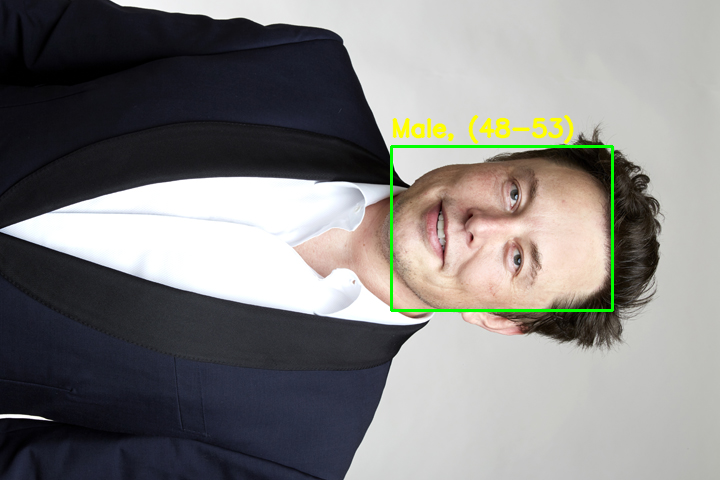

In [10]:
for image_path in all_image_paths:
  img = cv2.imread(image_path)
  rotated = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
  detect_face_age_gender(rotated, face_net, age_net, gender_net)
  cv2_imshow(rotated)



The models are mainly trained on upright faces. After rotation, facial patterns change, so face detection and age/gender prediction become less accurate.

2.6.2
 change brightness

 2.6.2.1
enhance factor = 0.5
we set the contrast factor to 0.5 to darken image

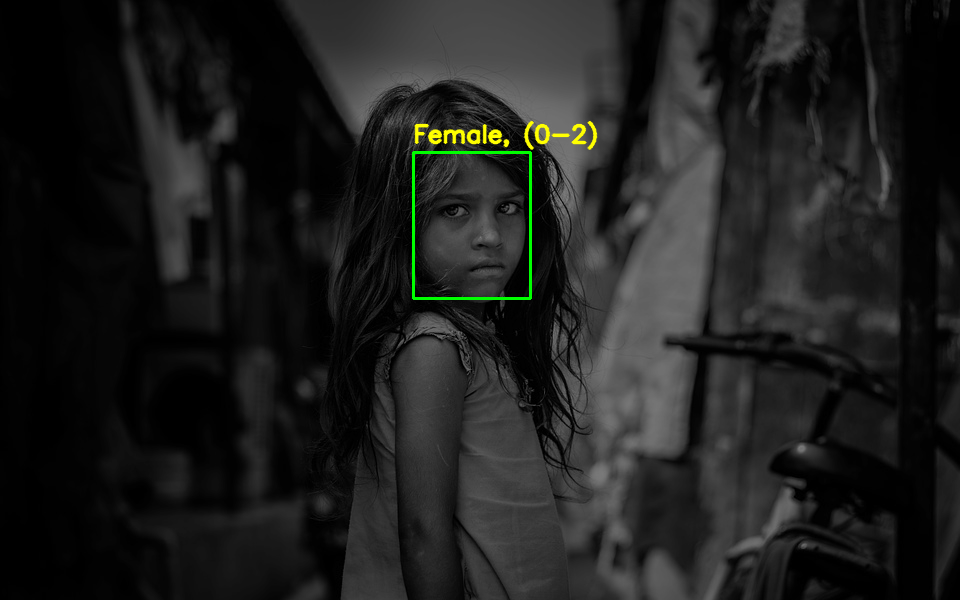

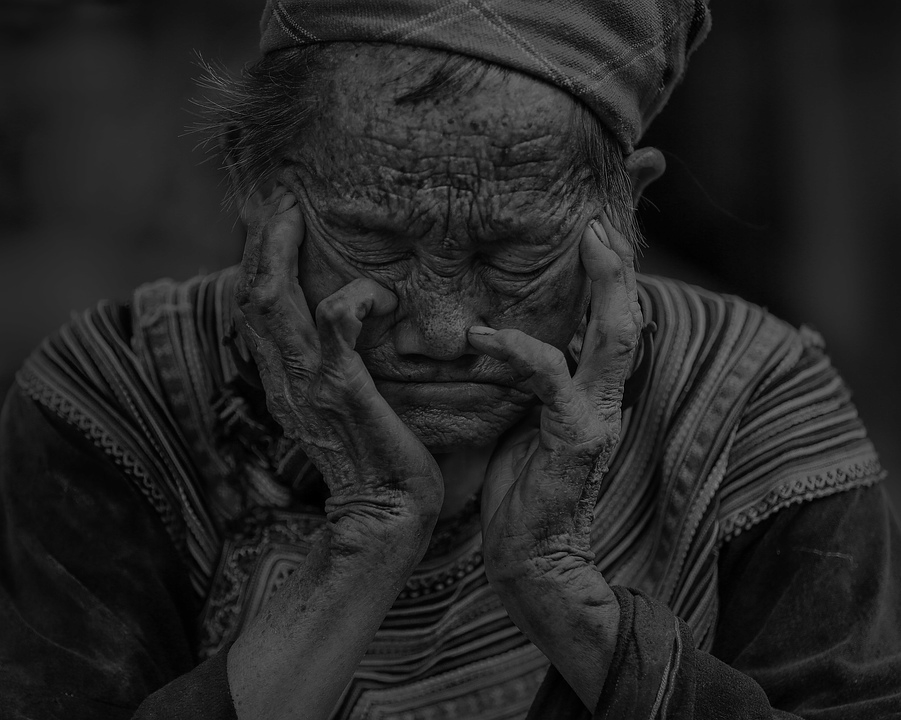

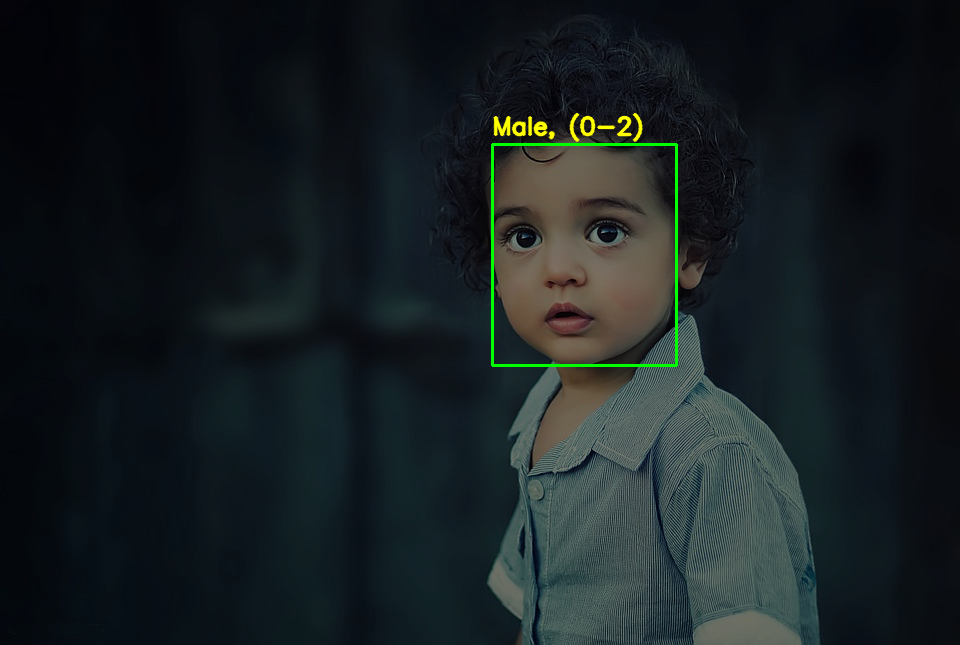

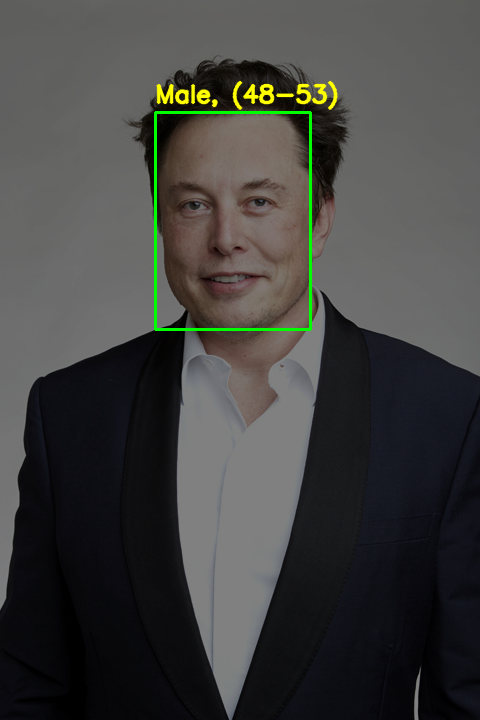

In [11]:

for image_path in all_image_paths:
  img = cv2.imread(image_path)

  darkened = cv2.convertScaleAbs(img, alpha=0.5, beta=0)
  detect_face_age_gender(darkened, face_net, age_net, gender_net)

  cv2_imshow(darkened)


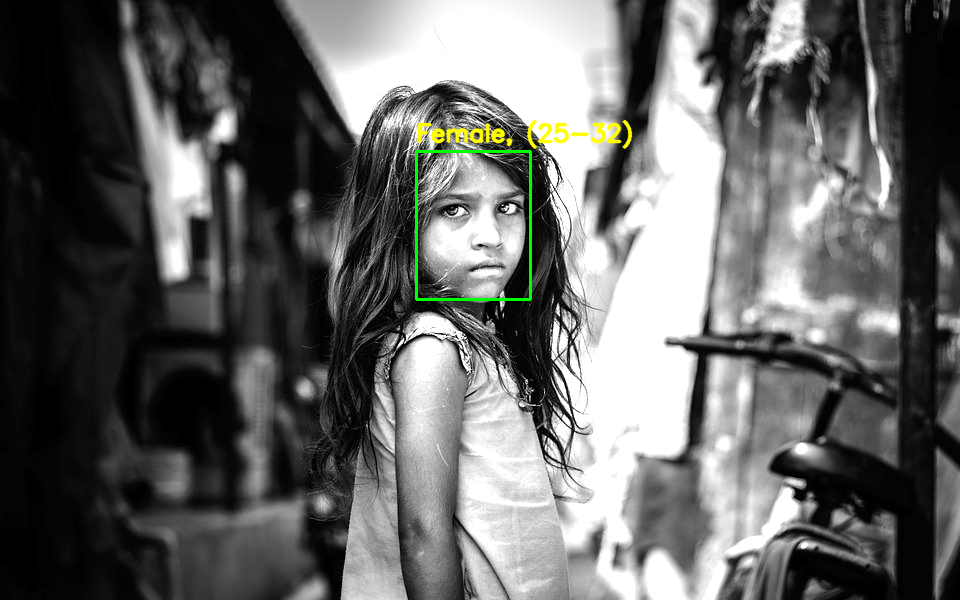

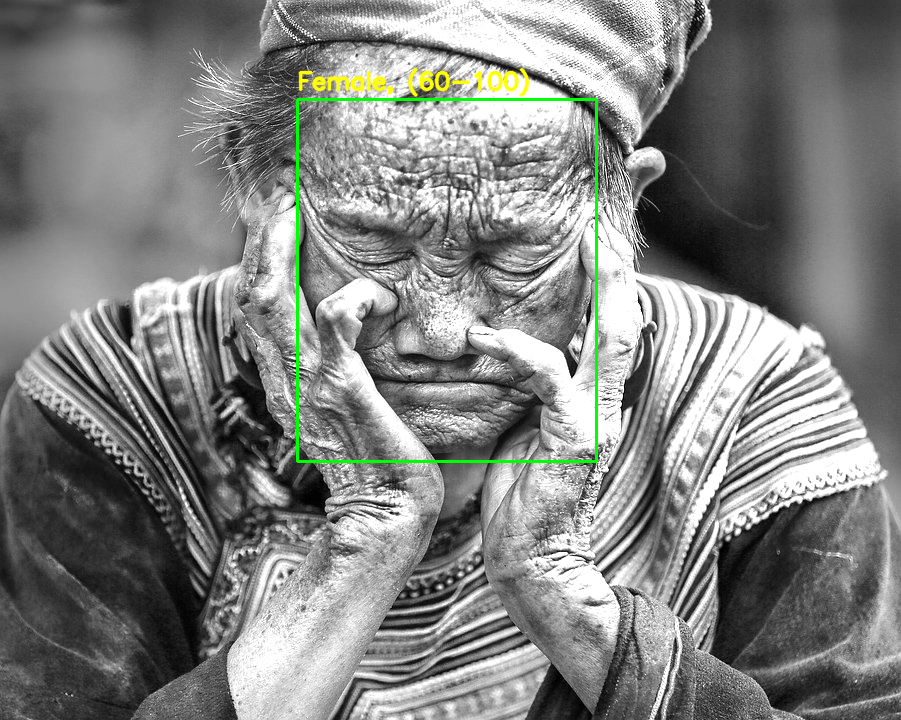

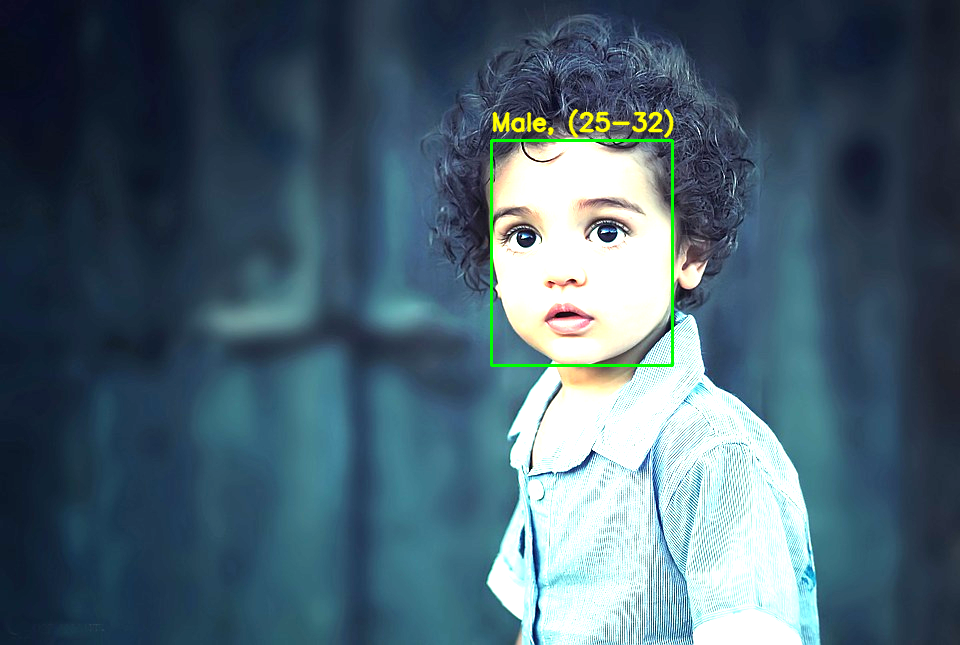

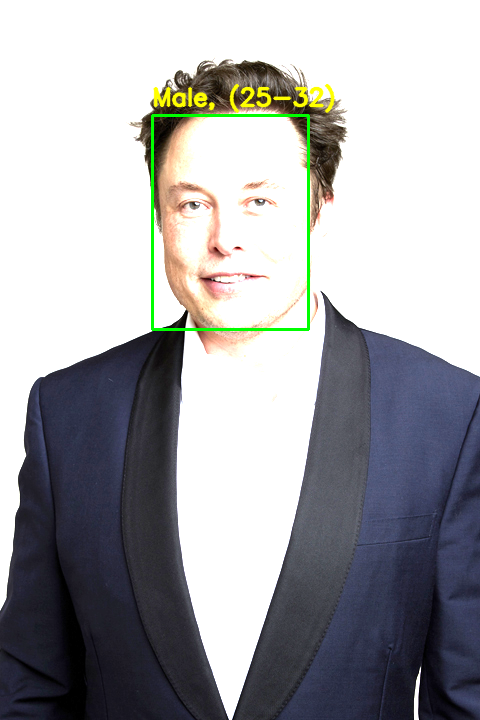

In [12]:

for image_path in all_image_paths:
  img = cv2.imread(image_path)

  darkened = cv2.convertScaleAbs(img, alpha=1.8, beta=0)
  detect_face_age_gender(darkened, face_net, age_net, gender_net)

  cv2_imshow(darkened)

Result: Low brightness hides facial details in shadows, while high brightness overexposes parts of the face. This reduces the useful information available to the models.

2.6.3

applying gaussian blur



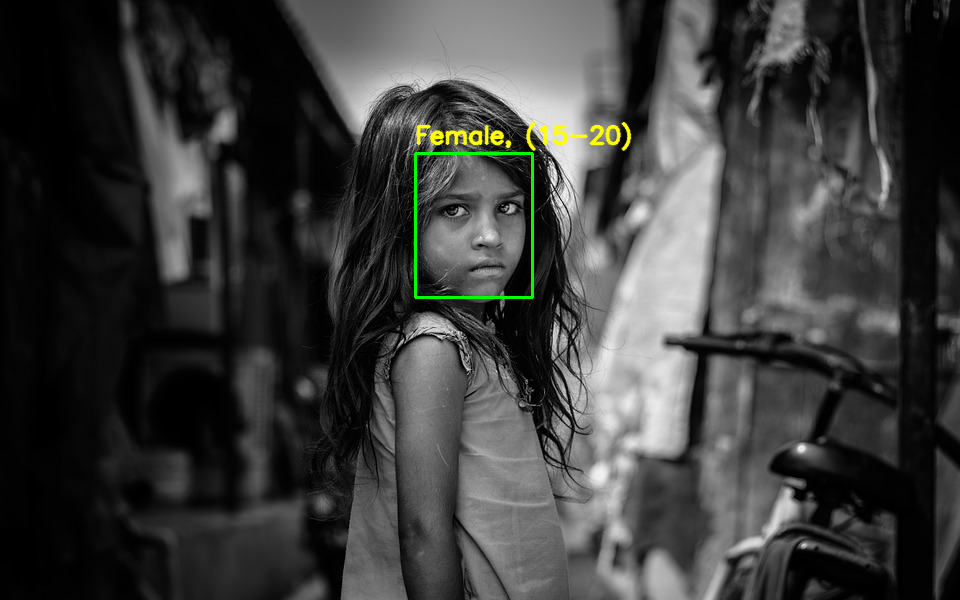

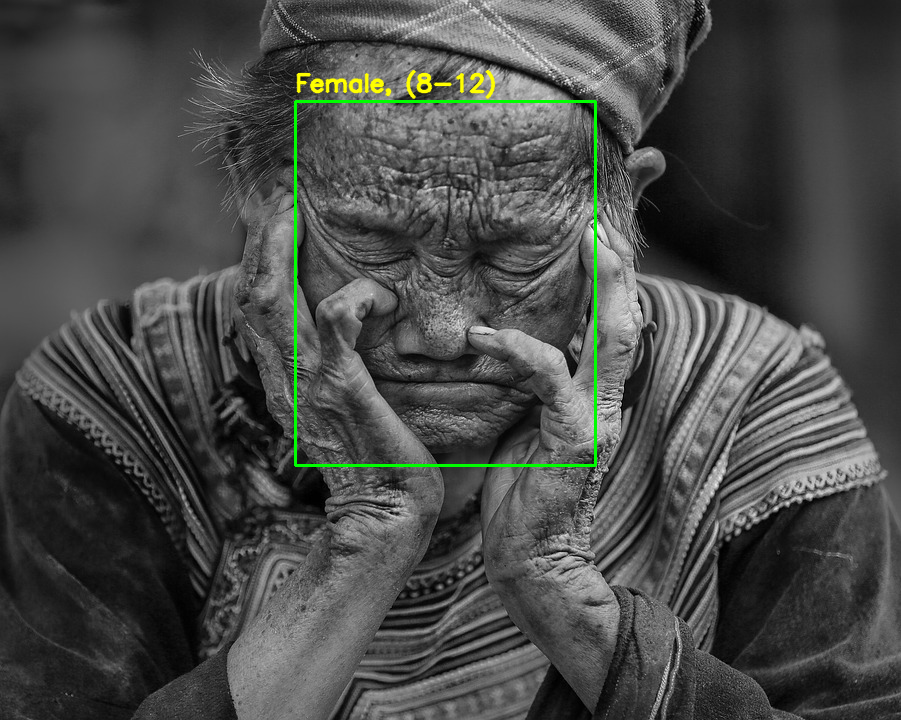

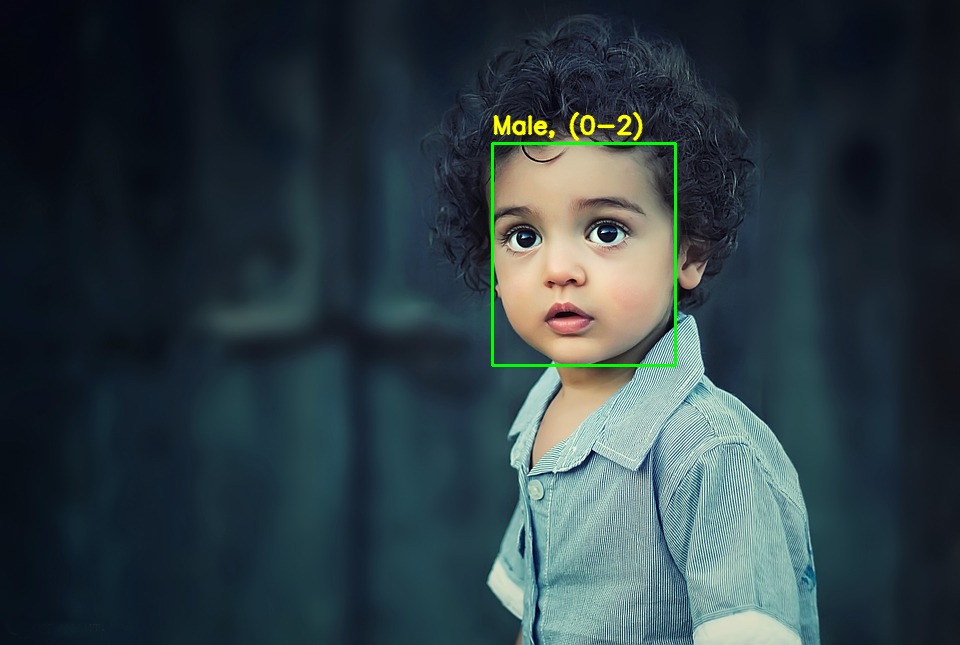

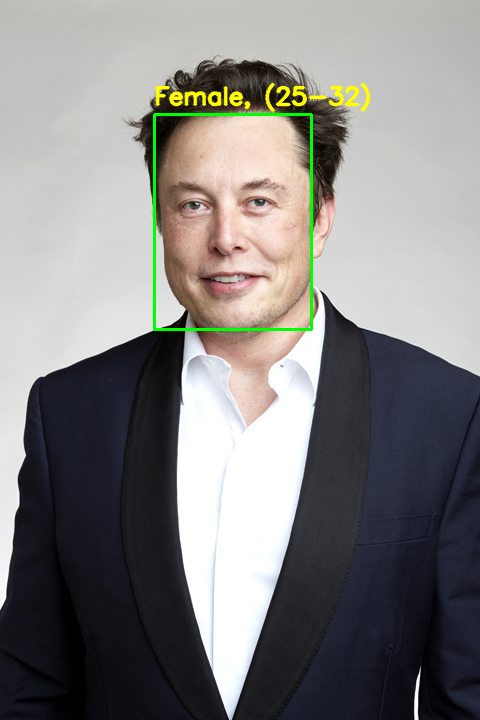

In [13]:
for image_path in all_image_paths:
  img = cv2.imread(image_path)
  detect_face_age_gender(img, face_net, age_net, gender_net, blur_face=True)
  cv2_imshow(img)


Result:
gender detection worsened significantly, and some age ranges are too far from accuracy. this is because
Gaussian blur removes important facial details such as wrinkles, skin texture, and edges. Therefore, especially age prediction becomes less accurate.

### 2.7 face detection in video


This code reads the input video frame by frame using VideoCapture. The video properties such as width, height, and FPS are extracted to create a VideoWriter object for saving the processed output video. Inside the loop, each frame is passed to the detect_face_age_gender() function to perform face detection and age/gender prediction. The processed frames are then written into a new output video file. Finally, the video resources are released properly using release().

In [15]:
import cv2

cap = cv2.VideoCapture("/content/drive/MyDrive/Age-Gender/Jobs_2 .mp4")

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output_video.mp4', fourcc, fps, (frame_width, frame_height))

while True:
    ret, frame = cap.read()
    if not ret:
        break
    output = detect_face_age_gender(frame, face_net, age_net, gender_net)
    out.write(output) # Write the processed frame

cap.release()
out.release()
